## NEUR 608 Project Analysis (Refactored) 

In [1]:
%matplotlib notebook
import os
import os.path as op
import numpy as np
import pickle as pkl
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import statsmodels.formula.api as smf
import seaborn as sns
import scipy.stats
import math
from nilearn.plotting import plot_matrix
from ndmg.stats.qa_graphs import *
import difflib
import kfold_learning
#import mpld3
#mpld3.enable_notebook()

/home/llevitis/py27/lib/python2.7/site-packages/matplotlib/__init__.py:1350: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)
/home/llevitis/py27/lib/python2.7/site-packages/matplotlib/__init__.py:1350: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)
/home/llevitis/py27/lib/python2.7/site-packages/matplotlib/__init__.py:1350: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_

In [2]:
DKT_labels = (pd.read_csv('scale033_parc.csv'))

In [3]:
labels = {}
for i in range(0, len(DKT_labels.label)): 
     labels[i] = DKT_labels.loc[i, 'hemisphere'] + DKT_labels.loc[i, 'label']
labels = list(labels.values())

In [4]:
locstat = pkl.load(open('derivatives/diffusion_bids/qa/graphs/Desikan2012/Desikan2012_locality_statistic.pkl','rb'))
nonzero = pkl.load(open('derivatives/diffusion_bids/qa/graphs/Desikan2012/Desikan2012_number_non_zeros.pkl','rb'))
edgewt = pkl.load(open('derivatives/diffusion_bids/qa/graphs/Desikan2012/Desikan2012_edge_weight.pkl','rb'))
cfclust = pkl.load(open('derivatives/diffusion_bids/qa/graphs/Desikan2012/Desikan2012_clustering_coefficients.pkl','rb'))
degdist = pkl.load(open('derivatives/diffusion_bids/qa/graphs/Desikan2012/Desikan2012_degree_distribution.pkl','rb'))
eigseq = pkl.load(open('derivatives/diffusion_bids/qa/graphs/Desikan2012/Desikan2012_eigen_sequence.pkl','rb'))
bwcent = pkl.load(open('derivatives/diffusion_bids/qa/graphs/Desikan2012/Desikan2012_betweenness_centrality.pkl', 'rb'))

In [5]:
files = [op.join('/project/6008063/llevitis/DIAN/derivatives/diffusion_bids/graphs/Desikan2012/', fls)
         for fls in os.listdir('/project/6008063/llevitis/DIAN/derivatives/diffusion_bids/graphs/Desikan2012/')]
graphs = loadGraphs(files)
atlas = 'Desikan2012'
adj = {}
for subj in graphs: 
    if graphs[subj].nodes() != []: 
        tmp = nx.adj_matrix(graphs[subj], graphs[subj].nodes()).todense() 
        if tmp.shape == (83,83):
            adj[subj] = tmp

#### split up by visit labels, asymptomatic, symptomatic carriers

In [6]:
locstat_df = pd.DataFrame.from_dict(locstat, orient='index')
nonzero_df = pd.DataFrame.from_dict(nonzero, orient='index')
bwcent_df = pd.DataFrame.from_dict(bwcent, orient='index')
edgewt_df = pd.DataFrame.from_dict(edgewt, orient='index')
eigseq_df = pd.DataFrame.from_dict(eigseq, orient='index')
cfclust_df = pd.DataFrame.from_dict(cfclust, orient='index')

for sub in degdist['degree_distribution']['total_deg']:
    print(degdist['degree_distribution']['total_deg'])
    degdist_df = pd.DataFrame.from_dict(degdist['degree_distribution']['total_deg'],orient = 'index')

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist', array([31, 20,  7,  5,  5, 12, 12, 12,  5, 21, 25, 20, 15, 10, 29,  9, 24,
       15, 11, 25, 11,  8, 28,  6, 13, 32,  6,  9,  3,  7, 10, 22, 23, 10,
       12,  3,  7,  7,  8, 15, 16, 15, 37, 19, 32, 32, 27, 36, 24, 11, 16,
        8, 13, 22, 26,  7, 22, 32, 18, 36, 14, 21, 18, 18, 16, 18,  5, 13,
       12, 13, 33, 18, 14,  8, 24, 17,  3, 33, 17, 16, 24, 16,  9])), ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist', array([29,  9, 15, 13, 19,  6,  6, 23,  8, 14, 10,  8, 12,  8, 15,  8, 17,
        5,  6, 29, 18,  9, 37,  6, 15,  5,  9, 12,  5, 12,  7,  9,  5,  4,
        6,  9,  9, 13, 11,  7, 19, 17, 15, 13, 16, 22, 37, 10, 17, 33,  8,
       21, 17, 19, 22, 19,  6, 14, 21, 16, 21,  4, 14, 20,  4, 25, 15, 28,
        8, 16, 13, 20, 15, 10, 16, 15,  9, 27,  5,  6, 20, 12,  7])), ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist', array([18, 25, 10,  9,  5,  3, 11, 11,  5,  5, 12, 30, 14,  6, 10, 17,  7

### Get clinical, demographic, biomarker data

In [7]:
# get the list of subjects for whom NDMG was able to produce connectivity data for
graphs.keys()
subjects = list(set([x[4:10] for x in graphs.keys()])) # 202 unique subjects, 251 total connectomes

In [8]:
clinical = pd.read_csv('DIANdata_to_yasser_iturria-medina_D180461818/CLINICAL_D1804.csv')
pib = pd.read_csv('DIANdata_to_yasser_iturria-medina_D180461818/pib_D1804.csv')
pib_data = pib[pib['IMAGID'].isin(subjects)]
clinical_data = clinical[clinical['IMAGID'].isin(subjects)]
genetic = pd.read_csv('DIANdata_to_yasser_iturria-medina_D180461818/GENETIC_D1804.csv')
genetic_carriers = genetic[(genetic['Mutation'] == 1) & (genetic['IMAGID'].isin(subjects))]
carriers = set(genetic_carriers['IMAGID'])
genetic_noncarriers = genetic[(genetic['Mutation'] == 0) & (genetic['IMAGID'].isin(subjects))]
noncarriers = set(genetic_noncarriers['IMAGID'])

/home/llevitis/py27/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (118,513,519,992,996,998,1000,1002,1004,1006,1010,1012,1014,1016,1020,1022,1024,1040,1042,1044,1048,1116,1118,1135,1142) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [9]:
graphs

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist',
              <networkx.classes.graph.Graph at 0x2b9e22493350>),
             ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist',
              <networkx.classes.graph.Graph at 0x2b9e22493650>),
             ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist',
              <networkx.classes.graph.Graph at 0x2b9e2252c090>),
             ('sub-2ZCX99_ses-2ZCX99sv02smr_dwi_Desikan2012.edgelist',
              <networkx.classes.graph.Graph at 0x2b9e2252c0d0>),
             ('sub-P8HVA0_ses-P8HVA0sv02smr_dwi_Desikan2012.edgelist',
              <networkx.classes.graph.Graph at 0x2b9e2252c110>),
             ('sub-ABOX7W_ses-ABOX7Wsv00smr_dwi_Desikan2012.edgelist',
              <networkx.classes.graph.Graph at 0x2b9e2252c150>),
             ('sub-2FAMDB_ses-2FAMDBsv03smr_dwi_Desikan2012.edgelist',
              <networkx.classes.graph.Graph at 0x2b9e2252c190>),
             ('sub-1EBBWV_ses-1EBBWVsv00smr_dwi_

In [10]:
keys = [1, 2, 3, 4, 5]
eyo_dict = dict.fromkeys(keys, [0])
eyo_dict[0] = [-20, -15]
eyo_dict[1] = [-15, -10]
eyo_dict[2] = [-10, -5]
eyo_dict[3] = [-5, 0]
eyo_dict[4] = [0, 5]
eyo_dict[5] = [5, 10]
eyo_dict[6] = [10, 15]

In [11]:
carriers_by_eyo = {} 
for i in range(0, len(eyo_dict)):
    tmp = []
    for s in carriers:
        tmp_df = clinical[clinical.IMAGID == s]
        for x in range(0, len(tmp_df)):
            if (eyo_dict[i][0] < tmp_df.iloc[x, tmp_df.columns.get_loc("DIAN_EYO")] < eyo_dict[i][1]):
                visit = tmp_df.iloc[x, tmp_df.columns.get_loc("visit")]
                tmp.append(s + '_ses-' + s + 's' + visit + 'smr')
    carriers_by_eyo[i] = tmp

In [12]:
carriers_by_eyo

{0: ['44CAVQ_ses-44CAVQsv02smr',
  '2FAMDB_ses-2FAMDBsv00smr',
  '2FAMDB_ses-2FAMDBsv01smr',
  '2FAMDB_ses-2FAMDBsv03smr',
  'J85UII_ses-J85UIIsv00smr',
  'G07MMZ_ses-G07MMZsv03smr',
  '0F9ACS_ses-0F9ACSsv00smr',
  'KAXBBC_ses-KAXBBCsv00smr',
  'KAXBBC_ses-KAXBBCsv02smr',
  'GJDUBJ_ses-GJDUBJsv00smr',
  'D1YOXP_ses-D1YOXPsv00smr',
  '7SEMGS_ses-7SEMGSsv00smr',
  'GM4TCN_ses-GM4TCNsv03smr',
  '3RC7PE_ses-3RC7PEsv00smr',
  '8AKUN6_ses-8AKUN6sv00smr',
  '7WX8KG_ses-7WX8KGsv04smr',
  '5FZWKH_ses-5FZWKHsv03smr',
  'DHYR5O_ses-DHYR5Osv03smr',
  'F8ZIH8_ses-F8ZIH8sv03smr',
  '7713O3_ses-7713O3sv00smr',
  '41VBKZ_ses-41VBKZsv00smr',
  'PVACF4_ses-PVACF4sv00smr',
  'PCQ6GI_ses-PCQ6GIsv00smr',
  'OMDGV9_ses-OMDGV9sv03smr'],
 1: ['LKU6IH_ses-LKU6IHsv00smr',
  'VMGRO8_ses-VMGRO8sv00smr',
  'J85UII_ses-J85UIIsv03smr',
  'XZQMD7_ses-XZQMD7sv00smr',
  'JR429C_ses-JR429Csv00smr',
  'RWJKWP_ses-RWJKWPsv00smr',
  'RWJKWP_ses-RWJKWPsv03smr',
  'GJDUBJ_ses-GJDUBJsv03smr',
  'D1YOXP_ses-D1YOXPsv03smr',
  '

In [13]:
graphs_by_eyo = {} 
for i in range(0, len(carriers_by_eyo)):
    graphs_by_eyo[i] = [graphs[x] for x in graphs if any([y in x for y in carriers_by_eyo[i]])]

In [14]:
graphs_by_eyo

{0: [<networkx.classes.graph.Graph at 0x2b01d56962d0>,
 1: [<networkx.classes.graph.Graph at 0x2b01d56963d0>,
 2: [<networkx.classes.graph.Graph at 0x2b01d5696590>,
 3: [<networkx.classes.graph.Graph at 0x2b01d5696290>,
 4: [<networkx.classes.graph.Graph at 0x2b01d56961d0>,
 5: [<networkx.classes.graph.Graph at 0x2b01d56965d0>,
 6: [<networkx.classes.graph.Graph at 0x2b01d5696510>,
  <networkx.classes.graph.Graph at 0x2b01d56b3410>]}

In [15]:
def plot_averaged_connectome(graph, title="Averaged Connectome"): 
    adj = {} 
    for i in range(0,len(graph)):
        if graph[i].nodes() != []: 
            tmp = nx.adj_matrix(graph[i]).todense()
            if tmp.shape == (83,83):
                adj[i] = tmp
    mat = np.zeros(adj.values()[0].shape)
    for i in adj:
        mat += adj[i]
    mat = mat/len(adj.keys())
    plot_matrix(mat, title=title, cmap='viridis', vmin = 500, vmax=5000)

<IPython.core.display.Javascript object>


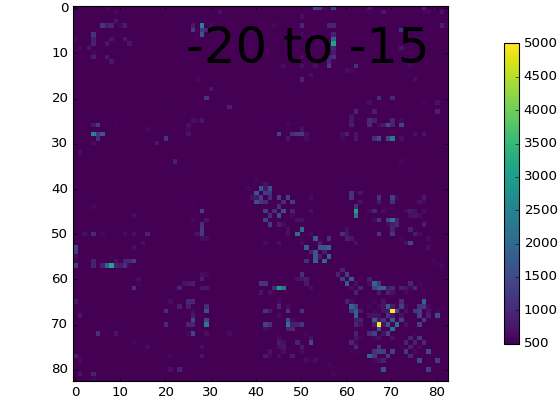

In [16]:
#%matplotlib notebook
titles = ["-20 to -15", "-15 to -10", "-10 to -5", "-5 to 0", "0 to 5", "5 to 10"]
plot_averaged_connectome(graphs_by_eyo[0], title=titles[0])

<IPython.core.display.Javascript object>


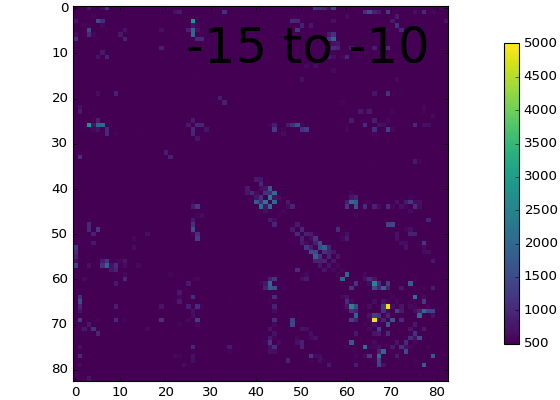

In [17]:
plot_averaged_connectome(graphs_by_eyo[1], title=titles[1])

<IPython.core.display.Javascript object>


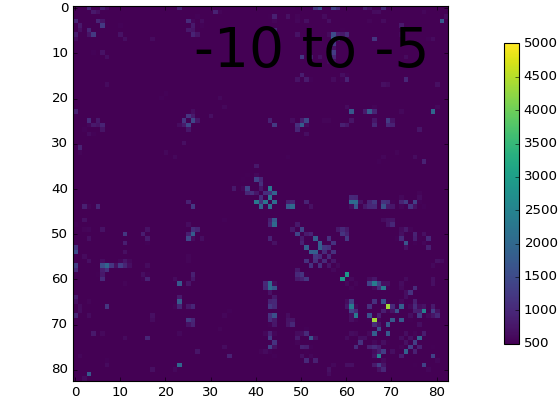

In [18]:
plot_averaged_connectome(graphs_by_eyo[2], title=titles[2])

<IPython.core.display.Javascript object>


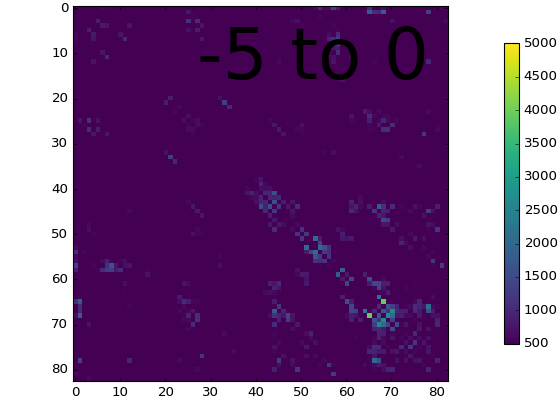

In [19]:
plot_averaged_connectome(graphs_by_eyo[3], title=titles[3])

<IPython.core.display.Javascript object>


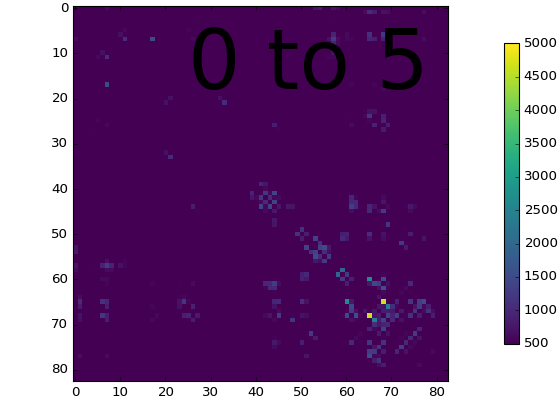

In [20]:
plot_averaged_connectome(graphs_by_eyo[4], title=titles[4])

<IPython.core.display.Javascript object>


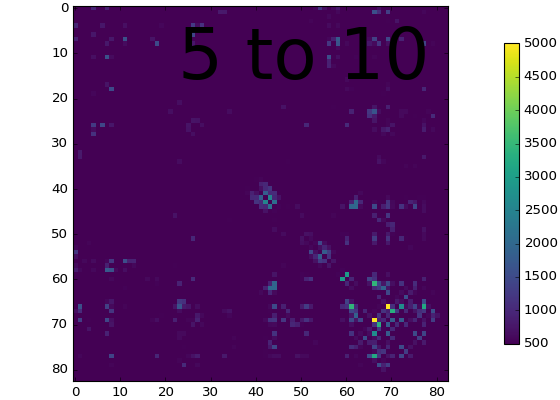

In [21]:
plot_averaged_connectome(graphs_by_eyo[5], title=titles[5])

# Play around with thresholding the matrix

In [22]:
graphs

OrderedDict([('sub-L0KYTY_ses-L0KYTYsv03smr_dwi_Desikan2012.edgelist',
              <networkx.classes.graph.Graph at 0x2b01d567a410>),
             ('sub-7XRXWC_ses-7XRXWCsv02smr_dwi_Desikan2012.edgelist',
              <networkx.classes.graph.Graph at 0x2b01d5696190>),
             ('sub-4LLB2T_ses-4LLB2Tsv02smr_dwi_Desikan2012.edgelist',
              <networkx.classes.graph.Graph at 0x2b01d56961d0>),
             ('sub-2ZCX99_ses-2ZCX99sv02smr_dwi_Desikan2012.edgelist',
              <networkx.classes.graph.Graph at 0x2b01d5696210>),
             ('sub-P8HVA0_ses-P8HVA0sv02smr_dwi_Desikan2012.edgelist',
              <networkx.classes.graph.Graph at 0x2b01d5696250>),
             ('sub-ABOX7W_ses-ABOX7Wsv00smr_dwi_Desikan2012.edgelist',
              <networkx.classes.graph.Graph at 0x2b01d5696290>),
             ('sub-2FAMDB_ses-2FAMDBsv03smr_dwi_Desikan2012.edgelist',
              <networkx.classes.graph.Graph at 0x2b01d56962d0>),
             ('sub-1EBBWV_ses-1EBBWVsv00smr_dwi_

In [23]:
def thresholded_connection_array(graphs, threshold):
    connection_list = {}
    good_subj = [] 
    for subj in graphs.keys():
        tmp_list = []
        if graphs[subj].nodes() != []: 
            tmp_matrix = nx.adj_matrix(graphs[subj], graphs[subj].nodes()).todense() 
            if tmp_matrix.shape == (83,83):
                for i in range(0, len(tmp_matrix)): 
                    new_array = np.array(tmp_matrix[i], copy=True)
                    new_array[new_array<threshold]=0
                    num_connections_node = sum(new_array.flatten())
                    tmp_list.append(num_connections_node)
                connection_list[subj] = tmp_list
    return connection_list

### Merge PiB & W2V dataframes

In [10]:
import pandas as pd
import kfold_learning as kfl
from sklearn.model_selection import train_test_split

In [11]:
pib_raw_df = pd.read_csv('/project/6008063/llevitis/DIAN/DIANdata_to_yasser_iturria-medina_D180461818/pib_D1804.csv')
genetic = pd.read_csv('/project/6008063/llevitis/DIAN/DIANdata_to_yasser_iturria-medina_D180461818/GENETIC_D1804.csv')
clinical = pd.read_csv('/project/6008063/llevitis/DIAN/DIANdata_to_yasser_iturria-medina_D180461818/CLINICAL_D1804.csv')
demographic = pd.read_csv('/project/6008063/llevitis/DIAN/DIANdata_to_yasser_iturria-medina_D180461818/DEMOGRAPHICS_D1804.csv')
w2v_df = pd.read_csv('/project/6008063/llevitis/DIAN/derivatives/connectome_embedding_results/wvm_df.csv', index_col=0)
degree_df = pd.read_csv('/project/6008063/llevitis/DIAN/edge_weight_df.csv')

In [12]:
clinical.columns

Index([u'newid11', u'visit', u'VISITAGEc', u'visitage', u'cdrglob',
       u'new_decage', u'new_decage_mean', u'decage', u'visit_date', u'IMAGID',
       ...
       u'dian_ao_new', u'FLAGGED', u'WR1', u'WR2', u'Group', u'STUDY_STATUS',
       u'dian_EYO_type', u'DIAN_EYO', u'dian_mutpar_eyo', u'parental_eyo'],
      dtype='object', length=1250)

In [13]:
w2v_df.head()

,IMAGID,visit,rightlateralorbitofrontal_w2v,rightparsorbitalis_w2v,rightfrontalpole_w2v,rightmedialorbitofrontal_w2v,rightparstriangularis_w2v,rightparsopercularis_w2v,rightrostralmiddlefrontal_w2v,rightsuperiorfrontal_w2v,...,lefttransversetemporal_w2v,leftinsula_w2v,leftthalamusproper_w2v,leftcaudate_w2v,leftputamen_w2v,leftpallidum_w2v,leftaccumbensarea_w2v,lefthippocampus_w2v,leftamygdala_w2v,leftbrainstem_w2v
0,WQCPKV,v05,-0.649773,-0.693950,-0.190623,-0.156425,-0.631512,-0.383108,-0.194708,0.303965,...,-0.026848,0.180583,0.549069,0.496556,0.275971,0.514944,0.600428,0.398805,0.418929,0.314048
1,S6YAV3,v06,-0.286742,-0.226551,-0.043236,0.116024,-0.239939,0.237228,0.018598,0.354606,...,0.204675,0.042504,0.064854,0.228048,-0.101370,-0.129634,0.132879,-0.162759,-0.065894,-0.058474
2,KBOLFG,v03,-0.347007,-0.246899,-0.090645,-0.129076,-0.194416,-0.032935,-0.093252,0.083806,...,0.016332,-0.008486,0.107038,-0.003352,-0.121076,0.128459,0.033688,-0.012119,-0.063646,-0.060222
3,WDQRU0,v03,-0.319761,-0.362333,-0.145406,-0.224853,-0.139751,0.233441,0.158209,0.329467,...,-0.071307,0.012133,0.577721,0.333342,0.132171,0.242580,0.394874,0.396853,0.145670,0.358551
4,JQ8KSL,v00,-0.192172,-0.183235,-0.122283,-0.171901,-0.208153,0.032077,-0.057787,0.224385,...,0.192554,-0.004581,0.176646,-0.038852,-0.230803,-0.276932,-0.301172,-0.035132,-0.024525,-0.019541


In [14]:
## remake the dian_pib_roi dataframe for use with the w2v df
subjects = list(set(w2v_df.IMAGID))

In [15]:
len(subjects)

199

In [16]:
pib = pd.read_csv('/project/6008063/llevitis/DIAN/DIANdata_to_yasser_iturria-medina_D180461818/pib_D1804.csv')
pib_data = pib[pib['IMAGID'].isin(subjects)]

In [17]:
pib_data.shape

(458, 1057)

In [18]:
DKT_labels = (pd.read_csv('/project/6008063/llevitis/DIAN/scale033_parc.csv'))
labels = {}
for i in range(0, len(DKT_labels.label)): 
     labels[i] = DKT_labels.loc[i, 'hemisphere'] + DKT_labels.loc[i, 'label']
labels = list(labels.values())

In [19]:
labels

['rightlateralorbitofrontal',
 'rightparsorbitalis',
 'rightfrontalpole',
 'rightmedialorbitofrontal',
 'rightparstriangularis',
 'rightparsopercularis',
 'rightrostralmiddlefrontal',
 'rightsuperiorfrontal',
 'rightcaudalmiddlefrontal',
 'rightprecentral',
 'rightparacentral',
 'rightrostralanteriorcingulate',
 'rightcaudalanteriorcingulate',
 'rightposteriorcingulate',
 'rightisthmuscingulate',
 'rightpostcentral',
 'rightsupramarginal',
 'rightsuperiorparietal',
 'rightinferiorparietal',
 'rightprecuneus',
 'rightcuneus',
 'rightpericalcarine',
 'rightlateraloccipital',
 'rightlingual',
 'rightfusiform',
 'rightparahippocampal',
 'rightentorhinal',
 'righttemporalpole',
 'rightinferiortemporal',
 'rightmiddletemporal',
 'rightbankssts',
 'rightsuperiortemporal',
 'righttransversetemporal',
 'rightinsula',
 'rightthalamusproper',
 'rightcaudate',
 'rightputamen',
 'rightpallidum',
 'rightaccumbensarea',
 'righthippocampus',
 'rightamygdala',
 'leftlateralorbitofrontal',
 'leftparsorb

In [20]:
pib_cols = [x for x in pib.columns if "fSUVR_rsf" in x and 'WM' not in x]
pib_cols.insert(0,'IMAGID')
pib = pib_data[pib_cols]
hits = ['AMYGDALA', 'CAUD', 'HIPPOCAMPUS', 'PALLIDUM', 'PUTAMEN', 'THALAMUS', 'ACCUMBENS']
subcols = [x for x in pib.columns if any([y in x for y in hits]) and all([y not in x for y in ['CTX', 'WM', 'TOT']])]
ctx_cols = [x for x in pib.columns if any([y in x for y in ['L_CTX', 'R_CTX', 'TOT_BRAINSTEM']])] 
brainstem_col = [x for x in pib.columns if 'TOT_BRAINSTEM' in x]
good_cols = ctx_cols + subcols
pib = pib[good_cols]
good_cols = [x.replace('PIB_fSUVR_rsf_','') for x in good_cols]
pib = pib.set_axis(good_cols, axis='columns', inplace=False)
labels_subcortical = [x for x in labels if any(y in x for y in ['accumbens', 'amygdala', 'hippocampus', 'hypothalamus', 'caudate', 'globus', 'pallidum', 'putamen', 'thalamus', 'brainstem'])]
ldf = pd.DataFrame(columns=['roi'])
ldf.roi = labels
sc_idx = list(ldf[ldf['roi'].isin(labels_subcortical)].index.values)
# add hemispheric info
lhctx = ['L_CTX_%s'%x.upper().replace('LEFT','') for x in ldf.roi[41:75]]
lsc = ['L_%s'%x.upper().replace('LEFT','') for x in ldf.roi[75:83]]
rhctx = ['R_CTX_%s'%x.upper().replace('RIGHT','') for x in ldf.roi[0:34]]
rsc = ['R_%s'%x.upper().replace('RIGHT','') for x in ldf.roi[34:41]]
ldf.loc[ldf.index[:83],'newlabs'] = rhctx + rsc + lhctx + lsc
# deal with the bssts (banks of the superior temporal sulcus) + brainstem
ldf.loc[ldf.index[30], 'newlabs'] = "R_CTX_SSTSBANK"
ldf.loc[ldf.index[71], 'newlabs'] = "L_CTX_SSTSBANK"
#ldf.loc[ldf.index[82], 'newlabs'] = "L_BRAINSTEM"
# use difflib to find the best matches for each column
for i,row in ldf.iterrows():
    if i < 83:
        roi = row['newlabs']
        match = difflib.get_close_matches(roi,pib.columns)
        if len(match) == 0:
            ldf.loc[i,'matching_lab'] = np.nan
        else:
            ldf.loc[i,'matching_lab'] = match[0]
# check if any roi doesn't have a matching label
ldf.loc[[x for x in ldf.index if not pd.notnull(ldf.loc[x,'matching_lab'])]]
# reindex the spreadsheet
pib_final = pib.reindex(columns=ldf.matching_lab.dropna().values)
list(zip(pib_final.columns,ldf.roi.tolist()))
pib_final.columns = ldf.roi

In [21]:
pib_final.head()

roi,rightlateralorbitofrontal,rightparsorbitalis,rightfrontalpole,rightmedialorbitofrontal,rightparstriangularis,rightparsopercularis,rightrostralmiddlefrontal,rightsuperiorfrontal,rightcaudalmiddlefrontal,rightprecentral,...,lefttransversetemporal,leftinsula,leftthalamusproper,leftcaudate,leftputamen,leftpallidum,leftaccumbensarea,lefthippocampus,leftamygdala,leftbrainstem
0,1.055,1.125,1.110,1.348,1.066,1.185,1.063,1.408,1.205,1.127,...,1.710,1.123,1.187,0.909,1.119,1.261,0.986,1.080,1.015,1.594
1,1.156,0.816,0.814,1.135,0.761,1.042,0.961,1.280,1.302,1.030,...,1.535,1.115,1.307,0.996,1.145,1.116,0.837,1.084,1.024,1.462
2,1.218,1.293,1.295,1.225,1.196,1.204,1.173,1.286,1.226,1.208,...,1.619,1.072,1.736,1.066,1.265,1.980,0.795,1.281,1.347,2.152
3,1.176,0.954,0.942,1.173,0.949,1.022,0.933,1.157,1.094,1.089,...,1.568,1.118,1.988,1.149,1.392,1.874,0.755,1.321,1.240,2.443
7,1.687,1.332,1.803,1.959,1.497,1.570,1.859,1.669,1.337,1.496,...,1.866,1.120,2.204,3.576,3.091,2.201,2.886,1.025,1.096,1.824


In [22]:
edge_weight_df = pd.read_csv('/project/6008063/llevitis/DIAN/edge_weight_df.csv', index_col=0)
#pib_df = pd.read_csv('/project/6008063/llevitis/DIAN/dian_pib_roi.csv', index_col=0)
pib_final.columns = [x + '_pib_pet' for x in pib_final.columns]

In [23]:
pib_final.head()

,rightlateralorbitofrontal_pib_pet,rightparsorbitalis_pib_pet,rightfrontalpole_pib_pet,rightmedialorbitofrontal_pib_pet,rightparstriangularis_pib_pet,rightparsopercularis_pib_pet,rightrostralmiddlefrontal_pib_pet,rightsuperiorfrontal_pib_pet,rightcaudalmiddlefrontal_pib_pet,rightprecentral_pib_pet,...,lefttransversetemporal_pib_pet,leftinsula_pib_pet,leftthalamusproper_pib_pet,leftcaudate_pib_pet,leftputamen_pib_pet,leftpallidum_pib_pet,leftaccumbensarea_pib_pet,lefthippocampus_pib_pet,leftamygdala_pib_pet,leftbrainstem_pib_pet
0,1.055,1.125,1.110,1.348,1.066,1.185,1.063,1.408,1.205,1.127,...,1.710,1.123,1.187,0.909,1.119,1.261,0.986,1.080,1.015,1.594
1,1.156,0.816,0.814,1.135,0.761,1.042,0.961,1.280,1.302,1.030,...,1.535,1.115,1.307,0.996,1.145,1.116,0.837,1.084,1.024,1.462
2,1.218,1.293,1.295,1.225,1.196,1.204,1.173,1.286,1.226,1.208,...,1.619,1.072,1.736,1.066,1.265,1.980,0.795,1.281,1.347,2.152
3,1.176,0.954,0.942,1.173,0.949,1.022,0.933,1.157,1.094,1.089,...,1.568,1.118,1.988,1.149,1.392,1.874,0.755,1.321,1.240,2.443
7,1.687,1.332,1.803,1.959,1.497,1.570,1.859,1.669,1.337,1.496,...,1.866,1.120,2.204,3.576,3.091,2.201,2.886,1.025,1.096,1.824


In [24]:
pib_final.insert(column='IMAGID', loc=0, allow_duplicates=True, value=pib_raw_df.IMAGID)
pib_final.insert(column='visit', loc=1, allow_duplicates=True, value=pib_raw_df.visit)
pib_final.insert(column='sex', loc=2, allow_duplicates=True, value=demographic.SEX)
pib_final.insert(column='visitage', loc=3, allow_duplicates=True, value=demographic.visitage)

In [25]:
pib_final.head()

,IMAGID,visit,sex,visitage,rightlateralorbitofrontal_pib_pet,rightparsorbitalis_pib_pet,rightfrontalpole_pib_pet,rightmedialorbitofrontal_pib_pet,rightparstriangularis_pib_pet,rightparsopercularis_pib_pet,...,lefttransversetemporal_pib_pet,leftinsula_pib_pet,leftthalamusproper_pib_pet,leftcaudate_pib_pet,leftputamen_pib_pet,leftpallidum_pib_pet,leftaccumbensarea_pib_pet,lefthippocampus_pib_pet,leftamygdala_pib_pet,leftbrainstem_pib_pet
0,DA0DVX,v00,0.0,47,1.055,1.125,1.110,1.348,1.066,1.185,...,1.710,1.123,1.187,0.909,1.119,1.261,0.986,1.080,1.015,1.594
1,DA0DVX,v02,0.0,49,1.156,0.816,0.814,1.135,0.761,1.042,...,1.535,1.115,1.307,0.996,1.145,1.116,0.837,1.084,1.024,1.462
2,DA0DVX,v04,0.0,51,1.218,1.293,1.295,1.225,1.196,1.204,...,1.619,1.072,1.736,1.066,1.265,1.980,0.795,1.281,1.347,2.152
3,DA0DVX,v06,0.0,53,1.176,0.954,0.942,1.173,0.949,1.022,...,1.568,1.118,1.988,1.149,1.392,1.874,0.755,1.321,1.240,2.443
7,HAB9WN,v00,1.0,41,1.687,1.332,1.803,1.959,1.497,1.570,...,1.866,1.120,2.204,3.576,3.091,2.201,2.886,1.025,1.096,1.824


In [27]:
pib_final.to_csv("pib_20181129.csv")

In [28]:
merged_w2v_pib_df = pd.merge(pib_final, w2v_df)

In [29]:
merged_w2v_pib_df.shape

(248, 170)

In [30]:
merged_w2v_pib_genetic_clinical_df = pd.merge(merged_w2v_pib_df, genetic.loc[:, ['IMAGID', 'visit', 'Mutation', 'apoe']], how='left')

In [31]:
merged_w2v_pib_genetic_clinical_df

,IMAGID,visit,sex,visitage,rightlateralorbitofrontal_pib_pet,rightparsorbitalis_pib_pet,rightfrontalpole_pib_pet,rightmedialorbitofrontal_pib_pet,rightparstriangularis_pib_pet,rightparsopercularis_pib_pet,...,leftthalamusproper_w2v,leftcaudate_w2v,leftputamen_w2v,leftpallidum_w2v,leftaccumbensarea_w2v,lefthippocampus_w2v,leftamygdala_w2v,leftbrainstem_w2v,Mutation,apoe
0,DA0DVX,v04,0.0,51,1.218,1.293,1.295,1.225,1.196,1.204,...,0.199380,0.071913,0.196006,0.284319,0.149188,0.366384,0.024102,0.273114,0,34.0
1,HAB9WN,v01,1.0,42,1.607,1.519,1.882,2.030,1.638,1.636,...,0.077948,0.203675,0.138874,0.048910,0.223761,0.185988,0.293927,0.160088,1,23.0
2,NRIVVL,v02,0.0,50,1.076,0.960,1.181,1.166,1.086,0.963,...,0.114602,0.099788,0.053245,0.223674,0.050141,0.294490,0.203737,0.058050,0,33.0
3,F8ZIH8,v03,0.0,29,1.078,0.964,1.212,1.147,1.008,0.966,...,0.229354,0.174512,0.179698,0.238643,-0.043598,0.294331,0.247247,0.114162,1,33.0
4,PCQ6GI,v03,1.0,33,1.179,0.908,1.163,1.391,0.975,1.095,...,-0.089553,0.209658,0.388834,0.401711,0.301029,0.356035,0.268859,0.164711,1,33.0
5,D0IS2S,v04,1.0,52,2.440,3.015,4.565,3.013,3.114,2.360,...,0.089351,0.099434,0.283056,0.350358,0.138111,0.029035,0.001112,0.023456,1,34.0
6,USPD91,v00,0.0,40,NaN,NaN,NaN,NaN,NaN,NaN,...,0.230888,-0.095847,0.176341,0.093659,-0.148441,0.194411,0.037785,-0.119077,1,34.0
7,KUVUGB,v00,0.0,21,1.616,1.609,1.282,1.758,1.252,1.244,...,-0.108349,-0.063404,-0.222723,-0.234564,-0.108225,-0.241451,-0.343721,-0.095417,1,34.0
8,5S73B5,v03,1.0,35,1.411,1.466,1.562,1.946,1.462,1.393,...,0.306883,0.604630,0.284536,0.208563,0.472544,0.109611,0.219752,0.133835,1,33.0
9,F0VF6F,v00,0.0,20,NaN,NaN,NaN,NaN,NaN,NaN,...,0.272132,0.050869,0.121883,0.191753,-0.133059,0.287827,0.071968,0.246850,1,33.0


In [86]:
pib_og = pd.read_csv('/project/6008063/llevitis/DIAN/DIANdata_to_yasser_iturria-medina_D180461818/pib_D1804.csv')

In [89]:
# sanity check that there really is no PiB PET SUVR data for the participants above who are missing it
pib_og[pib_og['IMAGID'] == "ZL1BDX"]

,newid11,visit,VISITAGEc,visitage,visit_date,IMAGID,VISIT_QC,VISIT_DATE_RT,VISIT_TYPE,VISIT_STATUS,...,PIB_fSUVR_rsf_R_WM_TRANSTMP,PIB_fSUVR_rsf_TOT_WM_ROSANTCNG,PIB_fSUVR_rsf_TOT_WM_ROSMIDFRN,PIB_fSUVR_rsf_TOT_WM_SUPERFRN,PIB_fSUVR_rsf_TOT_WM_SUPERPRTL,PIB_fSUVR_rsf_TOT_WM_SUPERTMP,PIB_fSUVR_rsf_TOT_WM_SUPRAMRGNL,PIB_fSUVR_rsf_TOT_WM_TMPPOLE,PIB_fSUVR_rsf_TOT_WM_TRANSTMP,PIB_fSUVR_rsf_TOT_CORTMEAN
869,ZR04LL,v00,36.731237,36,06FEB2012,ZL1BDX,NaN,NaN,onsite,conducted,...,2.189,1.893,2.136,1.99,2.096,2.126,2.053,2.008,2.149,0.981
870,ZR04LL,v03,39.991781,39,12MAY2015,ZL1BDX,NaN,NaN,onsite,conducted,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [38]:
merged_w2v_pib_genetic_clinical_df = pd.merge(merged_w2v_pib_genetic_clinical_df, clinical.loc[:, ['IMAGID', 'visit', 'visitage', 'cdrglob', 'DIAN_EYO']], how='left')

In [39]:
merged_w2v_pib_genetic_clinical_df.shape

(189, 174)

In [40]:
# drop rows that are missing data 
merged_w2v_pib_genetic_clinical_df = merged_w2v_pib_genetic_clinical_df[pd.notnull(merged_w2v_pib_genetic_clinical_df['rightparsorbitalis_pib_pet'])]

In [41]:
merged_w2v_pib_genetic_clinical_df.shape

(189, 174)

In [42]:
len(merged_w2v_pib_genetic_clinical_df[merged_w2v_pib_genetic_clinical_df['cdrglob'] == 0])

141

In [43]:
merged_w2v_pib_genetic_clinical_carriers_df = merged_w2v_pib_genetic_clinical_df[merged_w2v_pib_genetic_clinical_df['Mutation'] == 1]
eyo_target = merged_w2v_pib_genetic_clinical_carriers_df.DIAN_EYO

In [44]:
merged_w2v_pib_genetic_clinical_carriers_df.head()

,IMAGID,visit,sex,visitage,rightlateralorbitofrontal_pib_pet,rightparsorbitalis_pib_pet,rightfrontalpole_pib_pet,rightmedialorbitofrontal_pib_pet,rightparstriangularis_pib_pet,rightparsopercularis_pib_pet,...,leftputamen_w2v,leftpallidum_w2v,leftaccumbensarea_w2v,lefthippocampus_w2v,leftamygdala_w2v,leftbrainstem_w2v,Mutation,apoe,cdrglob,DIAN_EYO
1,HAB9WN,v01,1.0,42,1.607,1.519,1.882,2.030,1.638,1.636,...,0.138874,0.048910,0.223761,0.185988,0.293927,0.160088,1,23.0,0.5,3.298630
3,F8ZIH8,v03,0.0,29,1.078,0.964,1.212,1.147,1.008,0.966,...,0.179698,0.238643,-0.043598,0.294331,0.247247,0.114162,1,33.0,0.0,-16.855108
4,PCQ6GI,v03,1.0,33,1.179,0.908,1.163,1.391,0.975,1.095,...,0.388834,0.401711,0.301029,0.356035,0.268859,0.164711,1,33.0,0.0,-12.067671
5,D0IS2S,v04,1.0,52,2.440,3.015,4.565,3.013,3.114,2.360,...,0.283056,0.350358,0.138111,0.029035,0.001112,0.023456,1,34.0,2.0,6.794521
6,KUVUGB,v00,0.0,21,1.616,1.609,1.282,1.758,1.252,1.244,...,-0.222723,-0.234564,-0.108225,-0.241451,-0.343721,-0.095417,1,34.0,0.5,0.000000


In [48]:
# Get their demographics
print('Number of mutation carriers: ' + str(merged_w2v_pib_genetic_clinical_carriers_df.shape[0]))
print('Average age: ' + str(np.round(np.mean(merged_w2v_pib_genetic_clinical_carriers_df['visitage']), 2)))
print('Age Range: ' + str(min(merged_w2v_pib_genetic_clinical_carriers_df['visitage'])) + '-' + str(max(merged_w2v_pib_genetic_clinical_carriers_df['visitage'])))
print('Number of female mutation carriers: ' + str(len(merged_w2v_pib_genetic_clinical_carriers_df[merged_w2v_pib_genetic_clinical_carriers_df['sex'] == 0])))
print('Number of male mutation carriers: ' + str(len(merged_w2v_pib_genetic_clinical_carriers_df[merged_w2v_pib_genetic_clinical_carriers_df['sex'] == 1])))
print('Average CDR: ' + str(np.round(np.mean(merged_w2v_pib_genetic_clinical_carriers_df['cdrglob']), 2)))

Number of mutation carriers: 113
Average age: 41.12
Age Range: 18-65
Number of female mutation carriers: 66
Number of male mutation carriers: 47
Average CDR: 0.38


In [49]:
len(set(list(merged_w2v_pib_genetic_clinical_carriers_df.IMAGID)))

89

In [50]:
merged_w2v_pib_genetic_clinical_carriers_df.columns

Index([u'IMAGID', u'visit', u'sex', u'visitage',
       u'rightlateralorbitofrontal_pib_pet', u'rightparsorbitalis_pib_pet',
       u'rightfrontalpole_pib_pet', u'rightmedialorbitofrontal_pib_pet',
       u'rightparstriangularis_pib_pet', u'rightparsopercularis_pib_pet',
       ...
       u'leftputamen_w2v', u'leftpallidum_w2v', u'leftaccumbensarea_w2v',
       u'lefthippocampus_w2v', u'leftamygdala_w2v', u'leftbrainstem_w2v',
       u'Mutation', u'apoe', u'cdrglob', u'DIAN_EYO'],
      dtype='object', length=174)

<IPython.core.display.Javascript object>


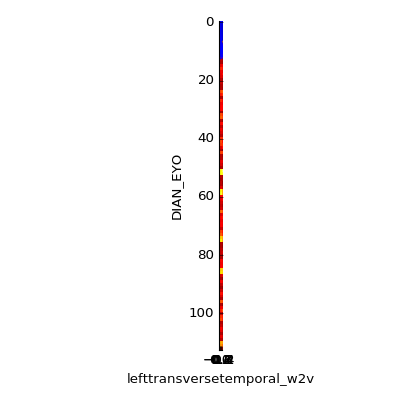

In [51]:
sns.lmplot('lefttransversetemporal_w2v', 'DIAN_EYO', merged_w2v_pib_genetic_clinical_carriers_df)

In [77]:
len(set(merged_w2v_pib_genetic_clinical_carriers_df.IMAGID))

89

In [95]:
from scipy.stats import zscore
pib_columns = [x for x in merged_w2v_pib_genetic_clinical_carriers_df.columns if 'pib_pet' in x]
sc_columns = [x for x in merged_w2v_pib_genetic_clinical_carriers_df.columns if '_w2v' in x]
final_data_df = merged_w2v_pib_genetic_clinical_carriers_df[merged_w2v_pib_genetic_clinical_carriers_df.columns[~merged_w2v_pib_genetic_clinical_carriers_df.columns.isin(['DIAN_EYO','Mutation', 'apoe', 'visitage', 'IMAGID', 'cdrglob','visit', 'sex'])]]
# zscore each column individually
final_data_df = final_data_df.apply(zscore)
final_data_pib_df = final_data_df[pib_columns]
final_data_sc_df = final_data_df[sc_columns]

In [96]:
final_data_df.head()

,rightlateralorbitofrontal_pib_pet,rightparsorbitalis_pib_pet,rightfrontalpole_pib_pet,rightmedialorbitofrontal_pib_pet,rightparstriangularis_pib_pet,rightparsopercularis_pib_pet,rightrostralmiddlefrontal_pib_pet,rightsuperiorfrontal_pib_pet,rightcaudalmiddlefrontal_pib_pet,rightprecentral_pib_pet,...,lefttransversetemporal_w2v,leftinsula_w2v,leftthalamusproper_w2v,leftcaudate_w2v,leftputamen_w2v,leftpallidum_w2v,leftaccumbensarea_w2v,lefthippocampus_w2v,leftamygdala_w2v,leftbrainstem_w2v
1,-0.355524,-0.275107,-0.226651,-0.229999,-0.242577,-0.229910,-0.357322,-0.475226,-0.549335,-0.233701,...,1.530929,1.389170,-0.490387,0.252433,0.035378,-0.496376,0.374167,0.100104,0.940617,0.139377
3,-0.861347,-0.819581,-0.750326,-0.927752,-0.858692,-0.920149,-0.878591,-0.844260,-0.864184,-0.640009,...,-0.359316,-0.231014,0.167797,0.118393,0.262092,0.553782,-1.069999,0.727544,0.671615,-0.113225
4,-0.764772,-0.874519,-0.788624,-0.734942,-0.890964,-0.787252,-0.992643,-0.840597,-0.723792,-0.779997,...,-0.678682,0.358900,-1.218535,0.279932,1.423532,1.456349,0.791538,1.084895,0.796158,0.164805
5,0.440980,1.192523,1.870391,0.546774,1.200891,0.515961,1.104683,0.543969,-0.080674,0.514040,...,-0.844909,-0.937757,-0.440817,-0.226689,0.836092,1.172116,-0.088475,-0.808856,-0.746782,-0.612131
6,-0.346918,-0.186813,-0.695613,-0.444936,-0.620070,-0.633751,-0.635179,-0.646465,-0.515269,-0.672445,...,-0.846969,0.541895,-1.300244,-0.975141,-1.972758,-2.065381,-1.419086,-2.375323,-2.733940,-1.265960


In [97]:
final_data_sc_df.shape

(113, 83)

In [104]:
# split the overall dataframe and keep the indices the same across the pib & sc training 
# and testing dataframes
tr_X, te_X = train_test_split(final_data_df, train_size = 0.67)
tr_pib_X = final_data_pib_df.loc[tr_X.index]
te_pib_X = final_data_pib_df.loc[te_X.index]
tr_sc_X = final_data_sc_df.loc[tr_X.index]
te_sc_X = final_data_sc_df.loc[te_X.index]

target = eyo_target
tr_y = target[tr_X.index]
tr_pib_y = target[tr_pib_X.index]
tr_sc_y = target[tr_sc_X.index]
te_y = target[te_X.index]
te_pib_y = target[te_pib_X.index]
te_sc_y = target[te_sc_X.index]

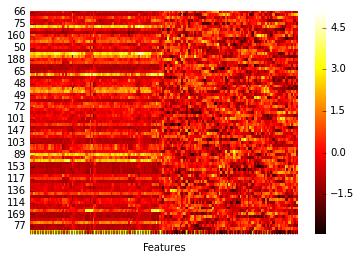

In [117]:
%matplotlib inline
ax = sns.heatmap(tr_X, cmap="hot")
plt.xlabel('Features')
plt.xticks(np.arange(len(tr_X.columns)), ('', '', '', '', ''))
plt.show()

In [76]:
len(list(merged_w2v_pib_genetic_clinical_carriers_df.loc[tr_X.index].IMAGID))

75

In [75]:
len(list(merged_w2v_pib_genetic_clinical_carriers_df.loc[te_X.index].IMAGID))

38

In [68]:
tr_sc_X.index

Int64Index([165,  48, 124, 110,  81,  73,  14,  79,  66,  59, 129,  19,  86,
             25, 122, 140, 103,  23, 127,   4,  29, 159,  30, 187,  46, 123,
            151, 147,  20,  43,   1, 128, 138, 113, 176,  24, 170,  17,  50,
             94, 119,  22,   6,   3, 185,  63,  57,  85, 136, 160,  40,  89,
            169, 117, 121,  58, 141, 173, 114, 186, 188,  37, 143,  49,  67,
             96,  87,  53,  71,  11, 101,  77, 118, 174, 181],
           dtype='int64')

In [57]:
tr_sc_y.index

Int64Index([113,  72, 114, 103, 164, 122,  29,  79, 110, 186,  23, 115, 165,
             24,   4, 123, 141,  75,  19, 181,  22,  17, 187,  63, 176, 160,
             25, 163, 101,  81,  20,  80,  11,  89,  58, 134,  90,  33,  71,
             92, 147, 111,  74,  87,  46, 138,   5,  39, 143, 140,  65, 153,
            129,  43, 118,  31,  77, 117,  30,  36,  53, 127,   1, 133, 185,
             37,  95, 135, 173,  67,  96, 188,  50, 119,  32],
           dtype='int64')

In [121]:
from sklearn import linear_model
ridge_output = kfl.kfold_feature_learning(tr_X, te_X, tr_y, te_y,
                                    folds = 20, p_cutoff = 0.05,
                                    clf = linear_model.RidgeCV(), 
                                    hide_test=False, 
                                    output="heavy") # don't apply to test data

running correlation for fold 1 of 20
running model for fold 1 of 20
running correlation for fold 2 of 20
running model for fold 2 of 20
running correlation for fold 3 of 20
running model for fold 3 of 20
running correlation for fold 4 of 20
running model for fold 4 of 20
running correlation for fold 5 of 20
running model for fold 5 of 20
running correlation for fold 6 of 20
running model for fold 6 of 20
running correlation for fold 7 of 20
running model for fold 7 of 20
running correlation for fold 8 of 20
running model for fold 8 of 20
running correlation for fold 9 of 20
running model for fold 9 of 20
running correlation for fold 10 of 20
running model for fold 10 of 20
running correlation for fold 11 of 20
running model for fold 11 of 20
running correlation for fold 12 of 20
running model for fold 12 of 20
running correlation for fold 13 of 20
running model for fold 13 of 20
running correlation for fold 14 of 20
running model for fold 14 of 20
running correlation for fold 15 of 20


In [122]:
ridge_output

{'all_model_weights':     rightlateralorbitofrontal_pib_pet  rightparsorbitalis_pib_pet  \
 0                           -0.120924                   -0.275557   
 1                           -0.057595                    0.005805   
 2                           -0.280146                   -0.015999   
 3                           -0.353804                   -0.339640   
 4                           -0.247409                   -0.597209   
 5                           -0.293778                   -0.272761   
 6                           -0.458344                   -0.074687   
 7                           -0.177283                   -0.246839   
 8                           -0.263097                   -0.227399   
 9                           -0.334389                   -0.423126   
 10                          -0.276920                   -0.318858   
 11                          -0.196954                   -0.090538   
 12                          -0.362695                   -0.550732   

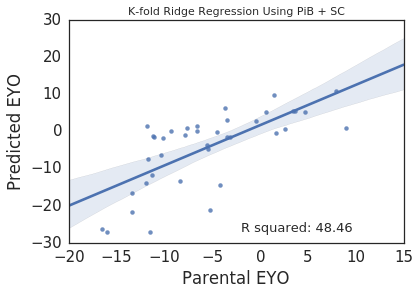

In [171]:
%matplotlib inline
sns.regplot(ridge_output['test_predicted'], te_y)
sns.set(font='Arial')
sns.set(font_scale=1.5)
sns.set_style('white')
ax = plt.gca()
ax.set(xlabel='Parental EYO', ylabel='Predicted EYO')
test_accuracy = "R squared: " + str(round(ridge_output['test_accuracy'], 2))
ax.text(-2, -27,test_accuracy, fontsize=13)
ax.set_title("K-fold Ridge Regression Using PiB + SC", fontsize=11)
ax.figure.savefig("KFoldRidge20_PiB-SC_predictions-2018-11-29.png")

In [111]:
pib_ridge_output = kfl.kfold_feature_learning(tr_pib_X, te_pib_X, tr_pib_y, te_pib_y,
                                    folds = 20, p_cutoff = 0.05,
                                    clf = linear_model.RidgeCV(), 
                                    hide_test=False) # don't apply to test data

running correlation for fold 1 of 20
running model for fold 1 of 20
running correlation for fold 2 of 20
running model for fold 2 of 20
running correlation for fold 3 of 20
running model for fold 3 of 20
running correlation for fold 4 of 20
running model for fold 4 of 20
running correlation for fold 5 of 20
running model for fold 5 of 20
running correlation for fold 6 of 20
running model for fold 6 of 20
running correlation for fold 7 of 20
running model for fold 7 of 20
running correlation for fold 8 of 20
running model for fold 8 of 20
running correlation for fold 9 of 20
running model for fold 9 of 20
running correlation for fold 10 of 20
running model for fold 10 of 20
running correlation for fold 11 of 20
running model for fold 11 of 20
running correlation for fold 12 of 20
running model for fold 12 of 20
running correlation for fold 13 of 20
running model for fold 13 of 20
running correlation for fold 14 of 20
running model for fold 14 of 20
running correlation for fold 15 of 20


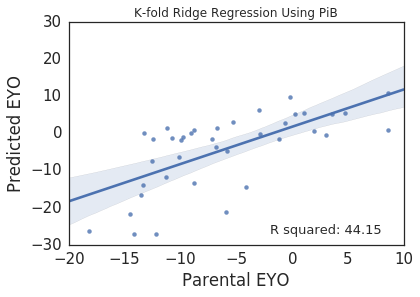

In [173]:
%matplotlib inline
sns.regplot(pib_ridge_output['test_predicted'], te_y)
sns.set(font='Arial')
sns.set(font_scale=1.5)
sns.set_style('white')
ax = plt.gca()

ax.set(xlabel='Parental EYO', ylabel='Predicted EYO')
test_accuracy = "R squared: " + str(round(pib_ridge_output['test_accuracy'], 2))
ax.text(-2, -27,test_accuracy, fontsize=13)
ax.set_title("K-fold Ridge Regression Using PiB", fontsize=12)
ax.figure.savefig("KFoldRidge20_PiB_predictions-2018-11-29.png")

In [62]:
list(zip(tr_X.columns,
         ridge_output['final_model_weights']))

[('rightlateralorbitofrontal_pib_pet', 0.20357900609495752),
 ('rightparsorbitalis_pib_pet', 0.9489256261630459),
 ('rightfrontalpole_pib_pet', 0.01706076111829776),
 ('rightmedialorbitofrontal_pib_pet', -0.48777649670861506),
 ('rightparstriangularis_pib_pet', 0.5447007586580552),
 ('rightparsopercularis_pib_pet', 1.2471161463520193),
 ('rightrostralmiddlefrontal_pib_pet', -0.22348894085919432),
 ('rightsuperiorfrontal_pib_pet', 0.20998762696707804),
 ('rightcaudalmiddlefrontal_pib_pet', 0.8046592450038874),
 ('rightprecentral_pib_pet', -0.4192838922120112),
 ('rightparacentral_pib_pet', 0.38059851425185637),
 ('rightrostralanteriorcingulate_pib_pet', -0.9826701547712483),
 ('rightcaudalanteriorcingulate_pib_pet', -0.5173694040346185),
 ('rightposteriorcingulate_pib_pet', 0.4060207963293734),
 ('rightisthmuscingulate_pib_pet', -0.33893263803286283),
 ('rightpostcentral_pib_pet', -0.5392516338919865),
 ('rightsupramarginal_pib_pet', 0.8047262013027392),
 ('rightsuperiorparietal_pib_pet

In [63]:
ridge_output_weights = {}
for i in range(0, len(tr_X.columns)):
    colname = tr_X.columns[i]
    ridge_output_weights[colname] = ridge_output['final_model_weights'][i]

In [64]:
ridge_output_weights_nonzero = {}
for x in ridge_output_weights: 
    if ridge_output_weights[x] > 0: 
        ridge_output_weights_nonzero[x] = ridge_output_weights[x]

In [65]:
[x for x in ridge_output_weights_nonzero.keys() if 'w2v' in x]

['rightsupramarginal_w2v',
 'leftfrontalpole_w2v',
 'rightparsorbitalis_w2v',
 'leftinsula_w2v',
 'rightinferiorparietal_w2v',
 'leftprecuneus_w2v',
 'lefttransversetemporal_w2v']

In [158]:
sc_ridge_output = kfl.kfold_feature_learning(tr_sc_X, te_sc_X, tr_sc_y, te_sc_y,
                                    folds = 30, p_cutoff = 0.05,
                                    clf = linear_model.RidgeCV(), 
                                    hide_test=True) # don't apply to test data

running correlation for fold 1 of 30
running model for fold 1 of 30
running correlation for fold 2 of 30
running model for fold 2 of 30
running correlation for fold 3 of 30
running model for fold 3 of 30
running correlation for fold 4 of 30
running model for fold 4 of 30
running correlation for fold 5 of 30
running model for fold 5 of 30
running correlation for fold 6 of 30
running model for fold 6 of 30
running correlation for fold 7 of 30
running model for fold 7 of 30
running correlation for fold 8 of 30
running model for fold 8 of 30
running correlation for fold 9 of 30
running model for fold 9 of 30
running correlation for fold 10 of 30
running model for fold 10 of 30
running correlation for fold 11 of 30
running model for fold 11 of 30
running correlation for fold 12 of 30
running model for fold 12 of 30
running correlation for fold 13 of 30
running model for fold 13 of 30
running correlation for fold 14 of 30
running model for fold 14 of 30
running correlation for fold 15 of 30


In [178]:
pib_lasso_output = kfl.kfold_feature_learning(tr_pib_X, te_pib_X, tr_pib_y, te_pib_y,
                                    folds = 10, p_cutoff = 0.05, 
                                    hide_test=False) # don't apply to test data

running correlation for fold 1 of 10
running model for fold 1 of 10


/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

running correlation for fold 2 of 10
running model for fold 2 of 10


/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

running correlation for fold 3 of 10
running model for fold 3 of 10


/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

running correlation for fold 4 of 10
running model for fold 4 of 10


/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

running correlation for fold 5 of 10
running model for fold 5 of 10


/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

running correlation for fold 6 of 10
running model for fold 6 of 10


/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

running correlation for fold 7 of 10
running model for fold 7 of 10


/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

running correlation for fold 8 of 10
running model for fold 8 of 10


/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/llevitis/py27/lib/python2.7/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You 

KeyboardInterrupt: 

In [177]:
pib_lasso_output

{'final_model_weights': 0     0.000000
 1     0.309369
 2     0.000000
 3    -0.544418
 4     0.130922
 5     0.069349
 6     0.000000
 7     0.000000
 8     0.000000
 9     0.000000
 10    0.284742
 11   -1.963914
 12   -0.009610
 13    0.000000
 14    0.000000
 15   -0.245268
 16    0.648504
 17    0.104824
 18    6.272015
 19    3.457019
 20   -0.177098
 21    0.076502
 22    0.000000
 23    0.000000
 24    0.000000
 25   -3.735485
 26    0.009088
 27    0.042403
 28    0.000000
 29    0.000000
         ...   
 53    0.910156
 54    0.000000
 55   -1.347008
 56   -0.003856
 57    0.000000
 58    0.000000
 59    0.012017
 60    0.000000
 61    3.498047
 62    0.014133
 63    0.000000
 64   -2.011613
 65    0.000000
 66   -0.870233
 67    0.000000
 68   -0.852523
 69    0.042600
 70    0.000000
 71    0.000000
 72    0.000000
 73   -4.620462
 74   -0.036280
 75   -0.207693
 76    0.000000
 77    1.949627
 78   -0.168956
 79    0.980246
 80    0.000000
 81    1.105875
 82    0.000000
 